In [1]:
import pandas as pd
import numpy as np
import matplotlib
matplotlib.rc('font', family='Microsoft JhengHei')
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

In [2]:
pd.set_option('display.max_columns', None)  # 顯示所有列

In [3]:
df_exit1 = pd.read_csv("raw_data(include Nov)\\500106003_data.csv")
df_exit2 = pd.read_csv("raw_data(include Nov)\\500101022_data.csv")
df_exit3 = pd.read_csv("raw_data(include Nov)\\500101181_data.csv")
df_exit4 = pd.read_csv("raw_data(include Nov)\\500106004_data.csv")

dataframe僅使用：公館捷運三號出口

In [4]:
df = df_exit3.copy()

In [5]:
df.drop('staion_id', axis=1, inplace=True)
df.drop('act', axis=1, inplace=True)
df['timestamp'] = df['timestamp'].astype(str)
df['timestamp'] = pd.to_datetime(df['timestamp'] + ' ' + df['time'])
df = df.drop(columns=['time'])
df['tot'] = df['tot'].astype(int)
df['sbi'] = df['sbi'].astype(int)
df['bemp'] = df['bemp'].astype(int)

In [6]:
df = df.rename(columns={
    "tot": "總停車格",
    "sbi": "目前車輛數量",
    "bemp": "空位數量",
})

In [7]:
df['month'] = df['timestamp'].dt.month
df['day'] = df['timestamp'].dt.day
df['weekday'] = df['timestamp'].dt.weekday
df['hour'] = df['timestamp'].dt.hour
df['minute'] = df['timestamp'].dt.minute
df['第幾周'] = df['timestamp'].dt.strftime('%V')
weekday_mapping = {0: 'Monday', 1: 'Teusday', 2: 'Wednesday', 3: 'Thursday', 4: 'Friday', 5: 'Saturday', 6: 'Sunday'}
df['星期'] = df['weekday'].map(weekday_mapping)
def is_weekday(weekday):
    if weekday in ['Saturday', 'Sunday']:
        return 0  # 假日
    else:
        return 1  # 工作日
df['workday'] = df['星期'].apply(is_weekday)

In [8]:
df['day_datetime'] = df['hour'].astype(str) + ':' + df['minute'].astype(str)

In [9]:
def calculate_rental_amount(df, vacancy_col):
    df['租借數量'] = df[vacancy_col].shift(1) - df[vacancy_col]
    df['租借數量'] = df['租借數量'].fillna(0).astype(int)
    df['租借數量'] = df['租借數量'] * -1
    return df
df = calculate_rental_amount(df, '空位數量')

In [10]:
df.head(10)

,timestamp,總停車格,目前車輛數量,空位數量,month,day,weekday,hour,minute,第幾周,星期,workday,day_datetime,租借數量
0,2023-10-02 00:00:00,90,0,90,10,2,0,0,0,40,Monday,1,0:0,0
1,2023-10-02 00:01:00,90,0,90,10,2,0,0,1,40,Monday,1,0:1,0
2,2023-10-02 00:02:00,90,0,90,10,2,0,0,2,40,Monday,1,0:2,0
3,2023-10-02 00:03:00,90,0,90,10,2,0,0,3,40,Monday,1,0:3,0
4,2023-10-02 00:04:00,90,2,88,10,2,0,0,4,40,Monday,1,0:4,-2
5,2023-10-02 00:05:00,90,4,86,10,2,0,0,5,40,Monday,1,0:5,-2
6,2023-10-02 00:06:00,90,7,83,10,2,0,0,6,40,Monday,1,0:6,-3
7,2023-10-02 00:07:00,90,10,80,10,2,0,0,7,40,Monday,1,0:7,-3
8,2023-10-02 00:08:00,90,14,76,10,2,0,0,8,40,Monday,1,0:8,-4
9,2023-10-02 00:09:00,90,18,72,10,2,0,0,9,40,Monday,1,0:9,-4


---

### 十月份& 十億月份資料
- 10月缺少： **<font color = orange>1、12、13、14、21、22、23、24</font>**

In [11]:
oct = df[df['month']==10]
nov = df[df['month']==11]
print(oct['day'].unique())
print('=====')
print(nov['day'].unique())

[ 2  3  4  5  6  7  8  9 10 11 15 16 17 18 19 20 25 26 27 28 29 30 31]
=====
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30]


----

In [12]:
df_full = df.copy()
df_full['date'] = df_full['timestamp'].dt.date
daily_record_count_full = df_full.groupby('date').size()
date_range_full = pd.date_range(start=df_full['date'].min(), end=df_full['date'].max(), freq='D')
missing_dates_full = date_range_full.difference(daily_record_count_full.index)
daily_record_count_full, missing_dates_full.tolist()

(date
 2023-10-02    1440
 2023-10-03    1440
 2023-10-04    1440
 2023-10-05    1440
 2023-10-06    1440
 2023-10-07    1440
 2023-10-08    1440
 2023-10-09    1440
 2023-10-10    1440
 2023-10-11    1440
 2023-10-15    1440
 2023-10-16    1440
 2023-10-17    1440
 2023-10-18    1440
 2023-10-19    1440
 2023-10-20    1440
 2023-10-25    1440
 2023-10-26    1440
 2023-10-27    1440
 2023-10-28    1440
 2023-10-29    1440
 2023-10-30    1440
 2023-10-31    1440
 2023-11-01    1440
 2023-11-02    1440
 2023-11-03    1440
 2023-11-04    1440
 2023-11-05    1440
 2023-11-06    1440
 2023-11-07    1440
 2023-11-08    1440
 2023-11-09    1440
 2023-11-10    1440
 2023-11-11    1440
 2023-11-12    1440
 2023-11-13    1440
 2023-11-14    1440
 2023-11-15    1440
 2023-11-16    1440
 2023-11-17    1440
 2023-11-18    1440
 2023-11-19    1440
 2023-11-20    1440
 2023-11-21    1440
 2023-11-22    1440
 2023-11-23    1440
 2023-11-24    1440
 2023-11-25    1440
 2023-11-26    1440
 2023-11-27   

### 缺失值？？？

先都補0

## EDA

### **<font color = orange>Data Distribution Visualization - Part 1</font>**

In [13]:
cleaned_data = df.dropna()
cleaned_data.drop(columns=['星期'], inplace=True)
cleaned_data.drop(columns=['day_datetime'], inplace=True)

In [14]:
cleaned_data.head(2)

,timestamp,總停車格,目前車輛數量,空位數量,month,day,weekday,hour,minute,第幾周,workday,租借數量
0,2023-10-02 00:00:00,90,0,90,10,2,0,0,0,40,1,0
1,2023-10-02 00:01:00,90,0,90,10,2,0,0,1,40,1,0


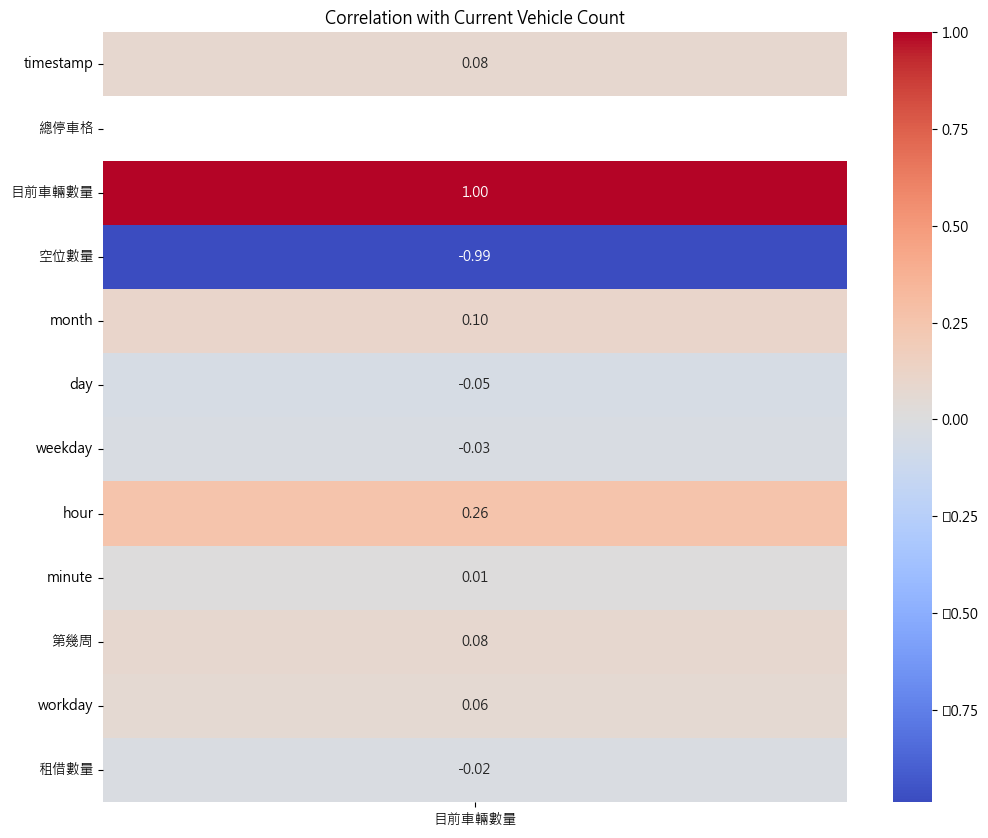

In [15]:
correlation = cleaned_data.corr()[['目前車輛數量']]
# 繪製熱力圖
plt.figure(figsize=(12, 10))
sns.heatmap(correlation, annot=True, fmt=".2f", cmap='coolwarm')
plt.title("Correlation with Current Vehicle Count")
plt.show()

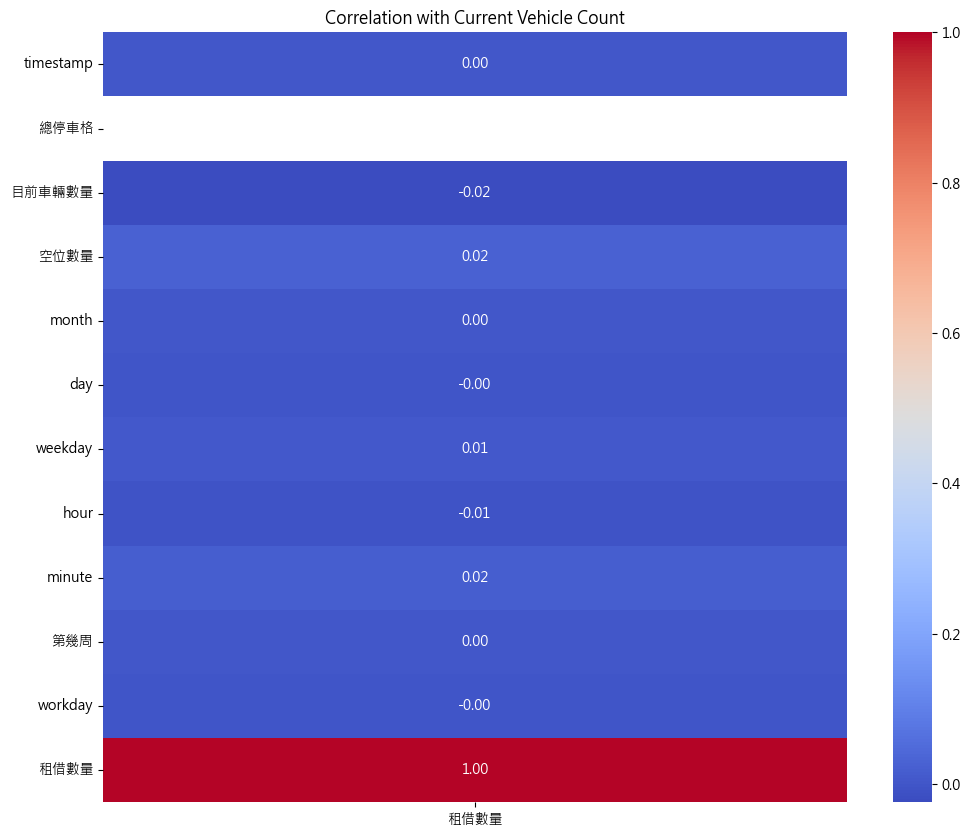

In [16]:
correlation = cleaned_data.corr()[['租借數量']]
# 繪製熱力圖
plt.figure(figsize=(12, 10))
sns.heatmap(correlation, annot=True, fmt=".2f", cmap='coolwarm')
plt.title("Correlation with Current Vehicle Count")
plt.show()

### **<font color = orange>Data Distribution Visualization - Part 2</font>**

租借數量是否有明顯的週期性

In [17]:
picture = df.copy()
picture.head()

,timestamp,總停車格,目前車輛數量,空位數量,month,day,weekday,hour,minute,第幾周,星期,workday,day_datetime,租借數量
0,2023-10-02 00:00:00,90,0,90,10,2,0,0,0,40,Monday,1,0:0,0
1,2023-10-02 00:01:00,90,0,90,10,2,0,0,1,40,Monday,1,0:1,0
2,2023-10-02 00:02:00,90,0,90,10,2,0,0,2,40,Monday,1,0:2,0
3,2023-10-02 00:03:00,90,0,90,10,2,0,0,3,40,Monday,1,0:3,0
4,2023-10-02 00:04:00,90,2,88,10,2,0,0,4,40,Monday,1,0:4,-2


In [18]:
week_list = picture['第幾周'].unique().tolist()

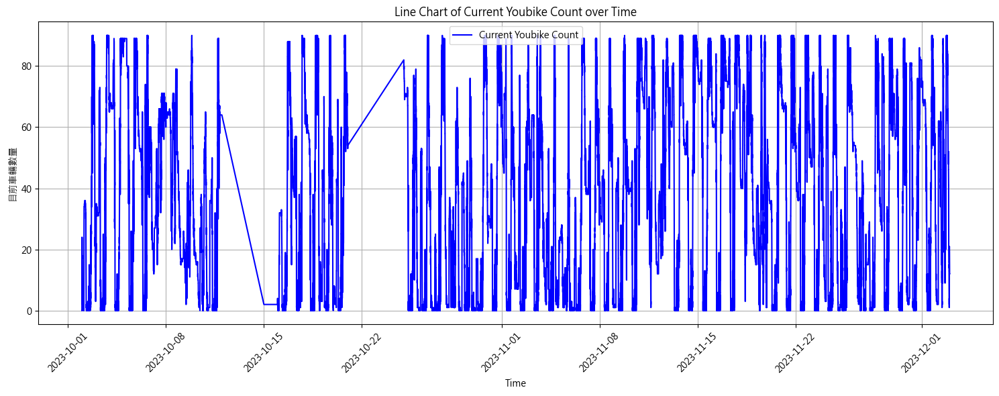

In [19]:
# Plotting the line graph for current vehicle count over time
plt.figure(figsize=(15, 6))
plt.plot(picture['timestamp'], picture['目前車輛數量'], label='Current Youbike Count', color='blue')
plt.xlabel('Time')
plt.ylabel('目前車輛數量')
plt.title('Line Chart of Current Youbike Count over Time')
plt.xticks(rotation=45)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

### Section 1：Per minute

In [20]:
### 繪製特定星期的每週車輛數量變化。
def plot_weekly_vehicle_data(df, weekday, weeks):
    filtered_data = df[df['第幾周'].isin(weeks)]
    filtered_data = filtered_data[filtered_data['星期'] == weekday]

    # 繪圖
    plt.figure(figsize=(20, 8))
    for week in weeks:
        weekly_data = filtered_data[filtered_data['第幾周'] == week]
        plt.plot(weekly_data['day_datetime'], weekly_data['目前車輛數量'], label=f'Week {week}')

    plt.xlabel('Time')
    plt.ylabel('Current Number of Vehicles')
    plt.title(f'Current Number of Vehicles Across Weeks: {weekday}')
    plt.legend()
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

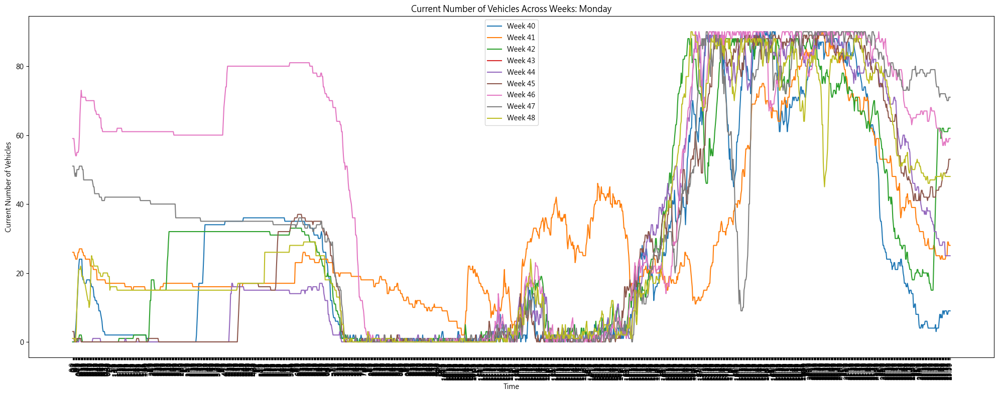

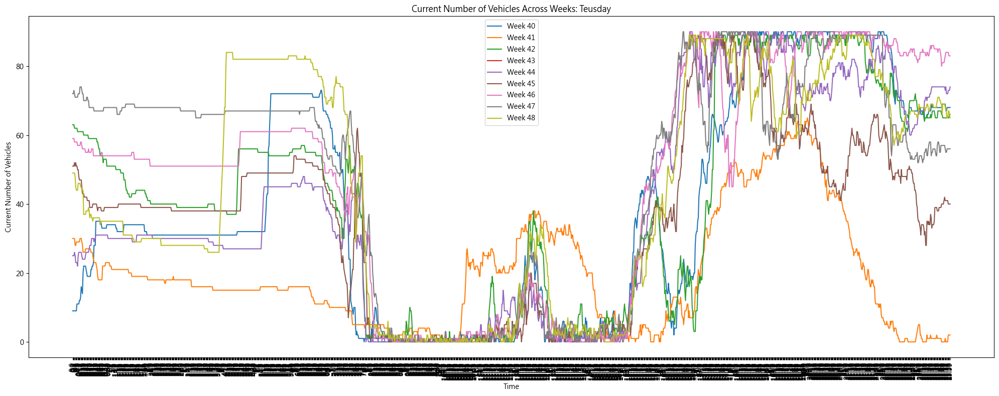

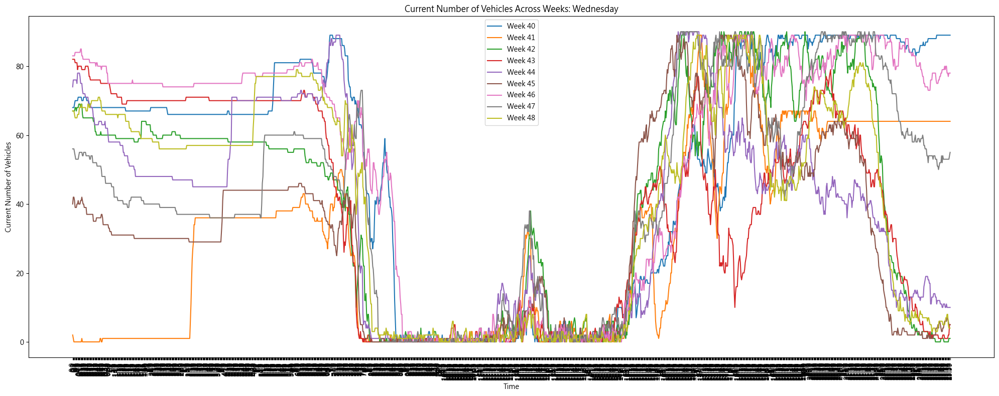

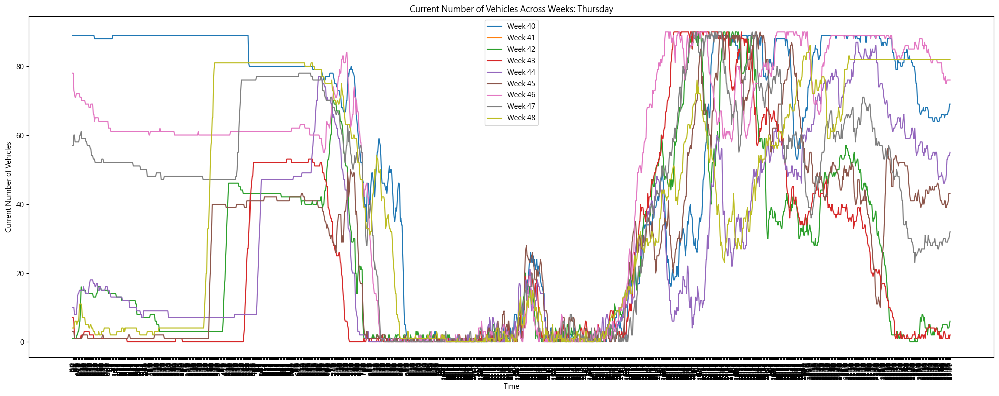

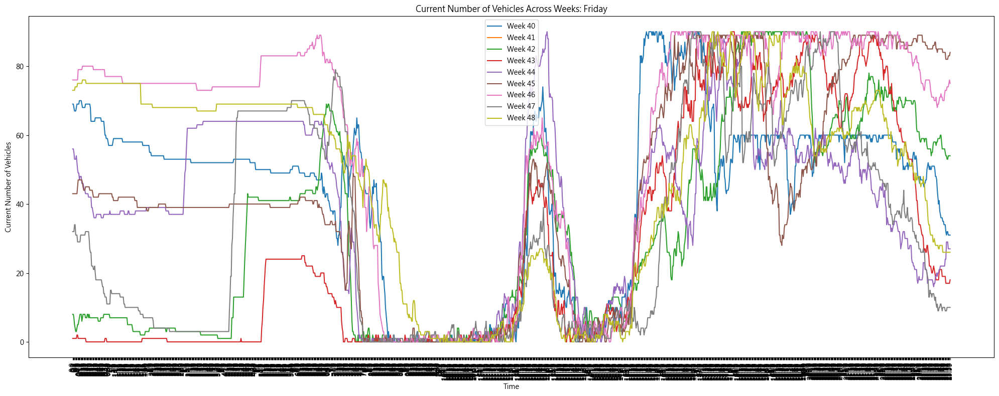

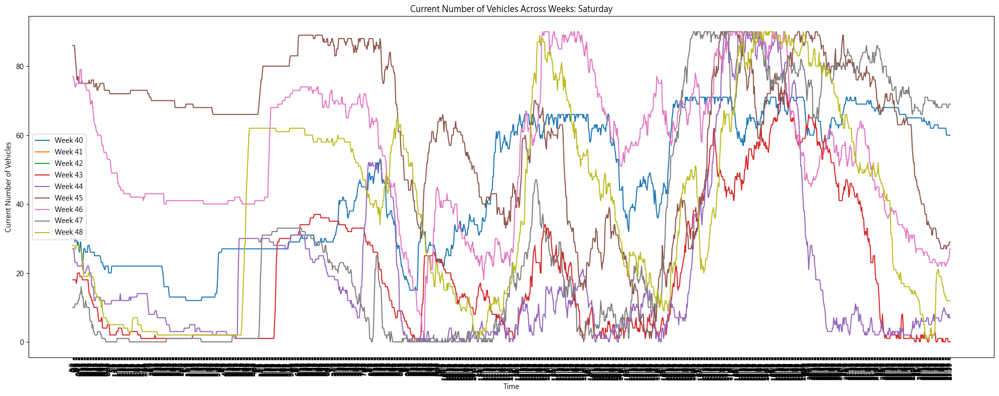

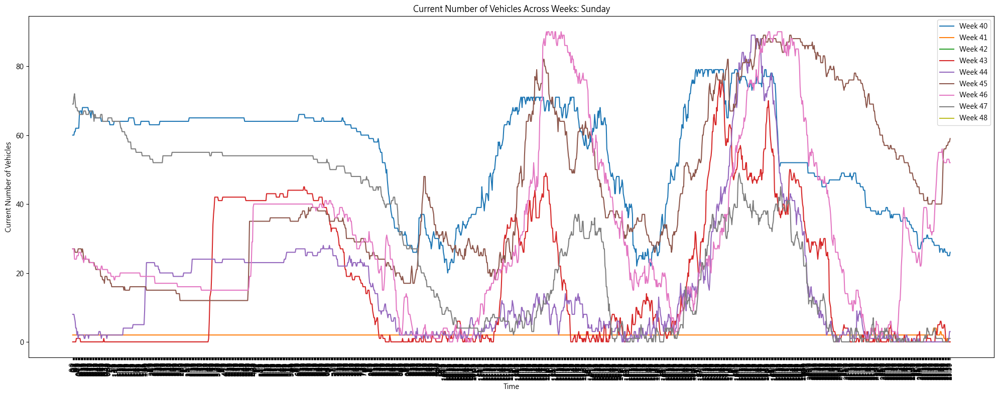

In [21]:
plot_weekly_vehicle_data(picture, 'Monday', week_list)
plot_weekly_vehicle_data(picture, 'Teusday', week_list)
plot_weekly_vehicle_data(picture, 'Wednesday',week_list)
plot_weekly_vehicle_data(picture, 'Thursday', week_list)
plot_weekly_vehicle_data(picture, 'Friday', week_list)
plot_weekly_vehicle_data(picture, 'Saturday', week_list)
plot_weekly_vehicle_data(picture, 'Sunday', week_list)

### Section 2：Per 10 minute

In [25]:
picture_10_min = df.copy()
picture_10_min = picture_10_min[picture_10_min['minute'] % 10 == 0]

In [26]:
### 繪製特定星期的每週車輛數量變化。
def plot_weekly_vehicle_data_10min(df, weekday, weeks):
    filtered_data = df[df['第幾周'].isin(weeks)]
    filtered_data = filtered_data[filtered_data['星期'] == weekday]

    # 繪圖
    plt.figure(figsize=(20, 8))
    for week in weeks:
        weekly_data = filtered_data[filtered_data['第幾周'] == week]
        plt.plot(weekly_data['day_datetime'], weekly_data['目前車輛數量'], label=f'Week {week}')

    plt.xlabel('Time')
    plt.ylabel('Current Number of Vehicles')
    plt.title(f'Current Number of Vehicles Across Weeks: {weekday}')
    plt.legend()
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

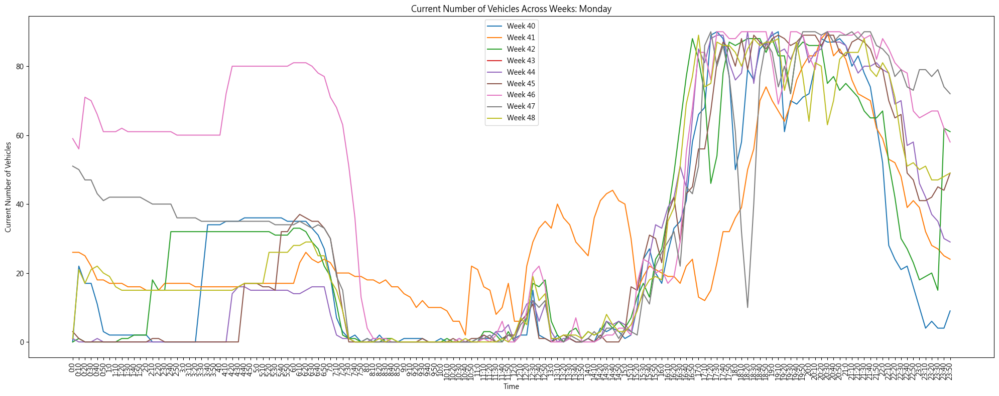

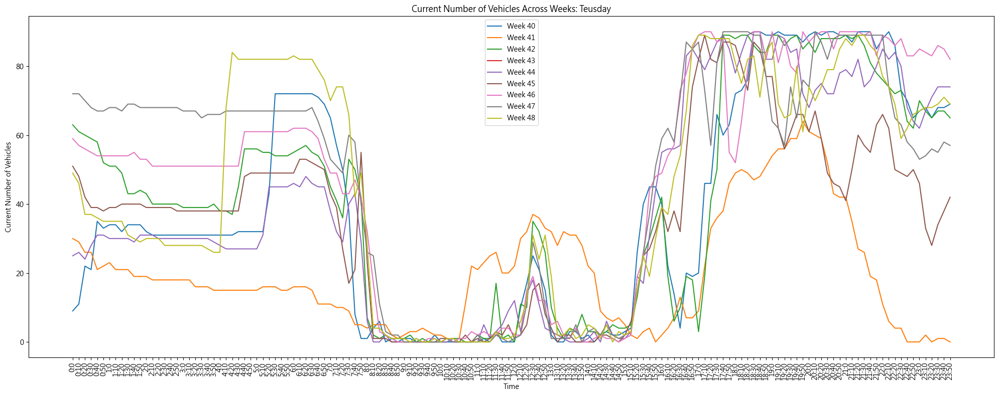

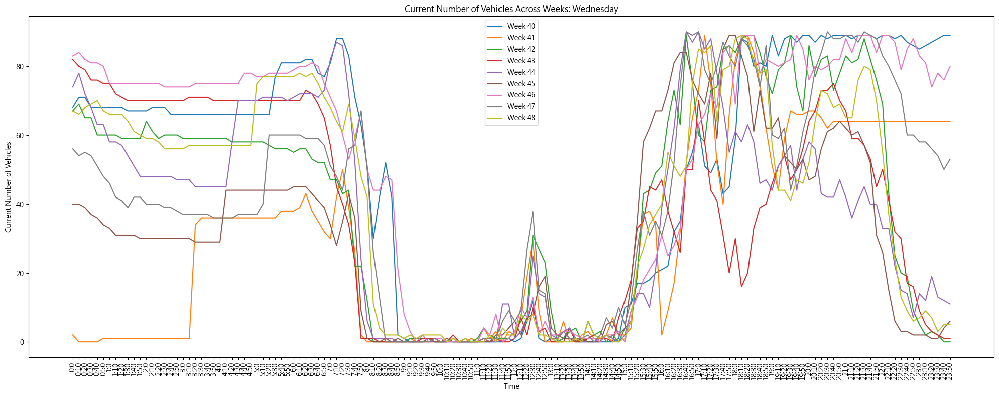

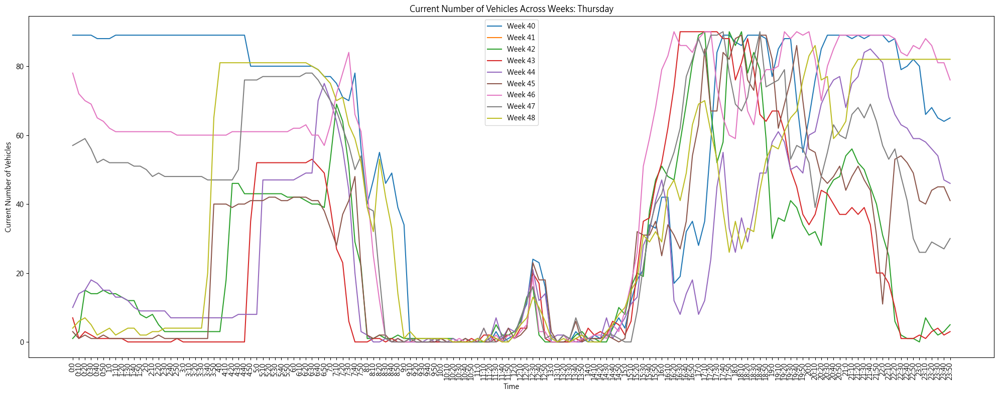

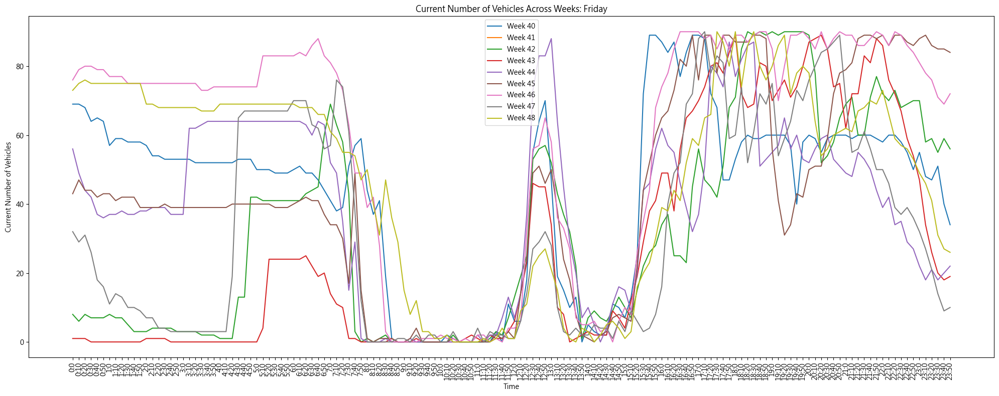

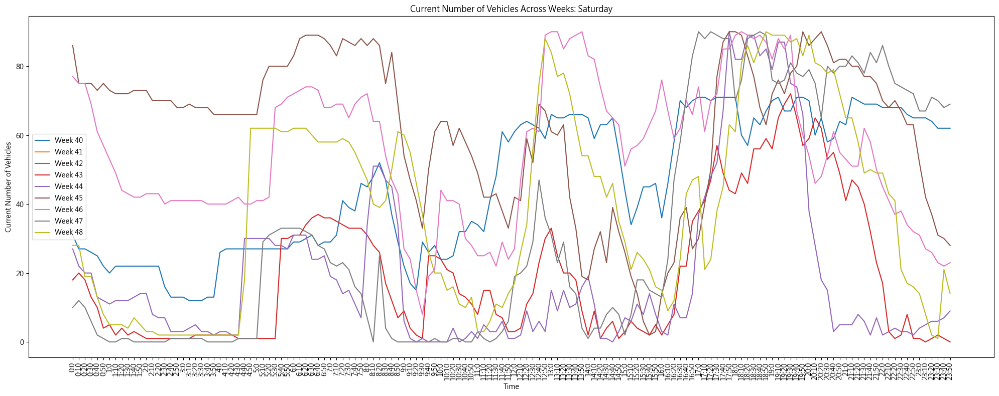

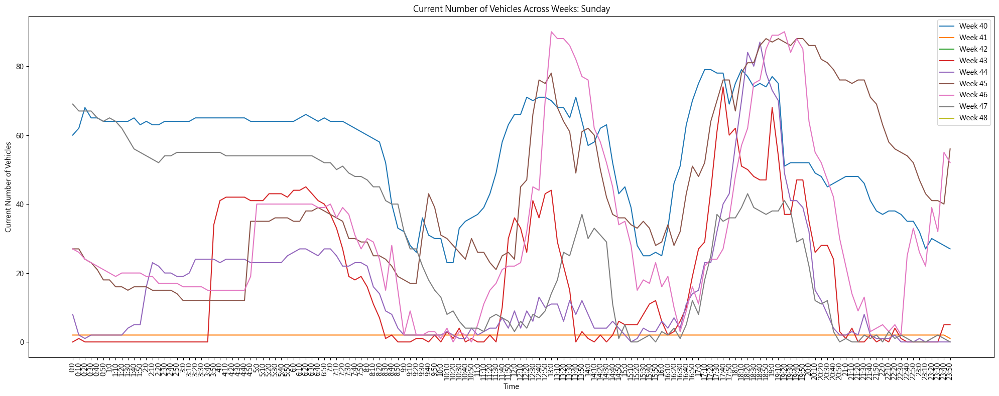

In [27]:
plot_weekly_vehicle_data_10min(picture_10_min, 'Monday', week_list)
plot_weekly_vehicle_data_10min(picture_10_min, 'Teusday', week_list)
plot_weekly_vehicle_data_10min(picture_10_min, 'Wednesday',week_list)
plot_weekly_vehicle_data_10min(picture_10_min, 'Thursday', week_list)
plot_weekly_vehicle_data_10min(picture_10_min, 'Friday', week_list)
plot_weekly_vehicle_data_10min(picture_10_min, 'Saturday', week_list)
plot_weekly_vehicle_data_10min(picture_10_min, 'Sunday', week_list)

### Section 3：Per 30 min 

In [28]:
picture_30_min = df.copy()
picture_30_min = picture_30_min[picture_30_min['minute'] % 30 == 0]

In [29]:
### 繪製特定星期的每週車輛數量變化。
def plot_weekly_vehicle_data_30min(df, weekday, weeks):
    filtered_data = df[df['第幾周'].isin(weeks)]
    filtered_data = filtered_data[filtered_data['星期'] == weekday]

    # 繪圖
    plt.figure(figsize=(20, 8))
    for week in weeks:
        weekly_data = filtered_data[filtered_data['第幾周'] == week]
        plt.plot(weekly_data['day_datetime'], weekly_data['目前車輛數量'], label=f'Week {week}')

    plt.xlabel('Time')
    plt.ylabel('Current Number of Vehicles')
    plt.title(f'Current Number of Vehicles Across Weeks: {weekday}')
    plt.legend()
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

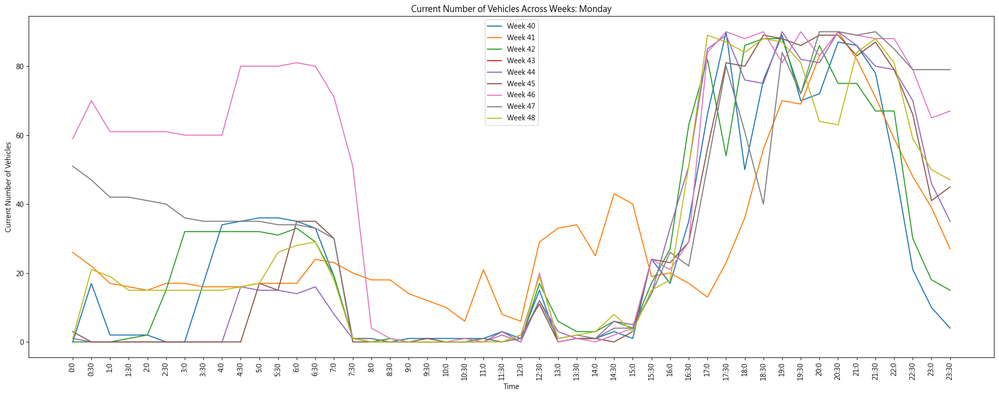

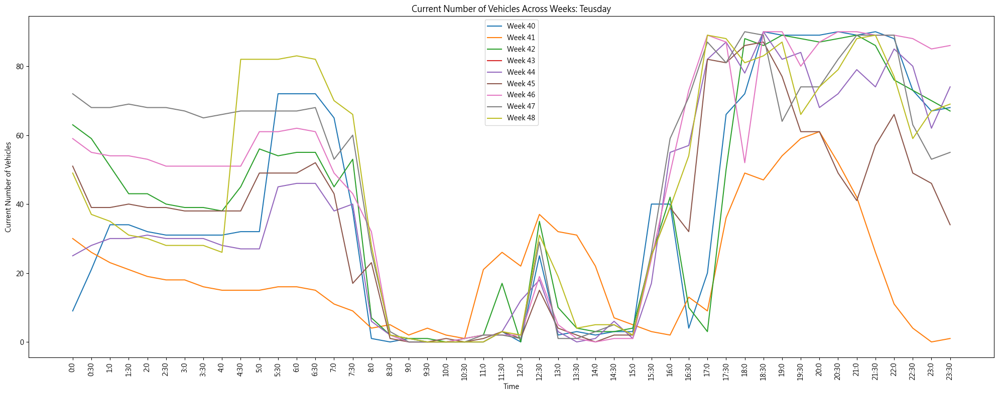

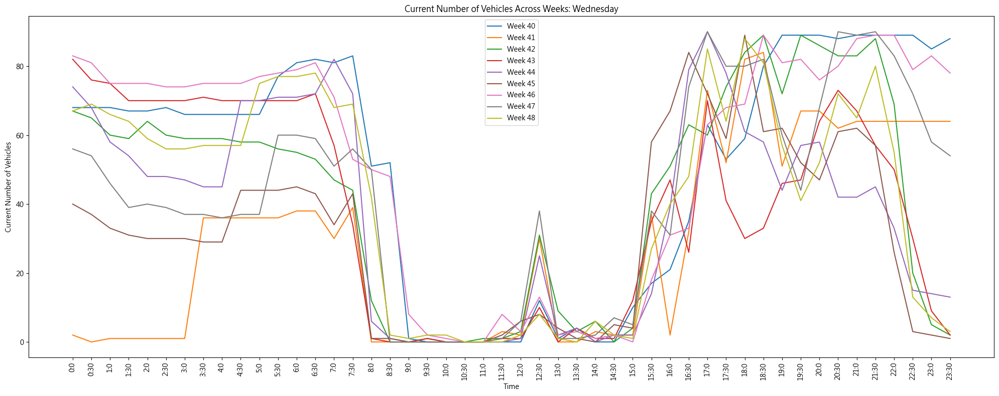

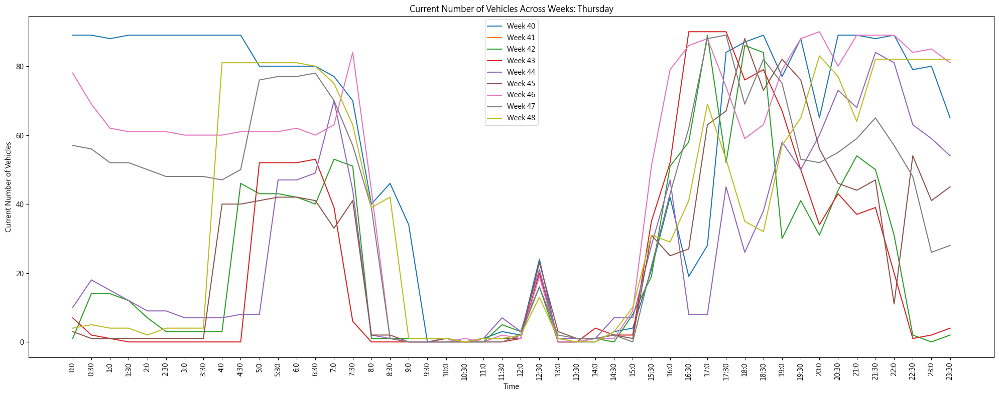

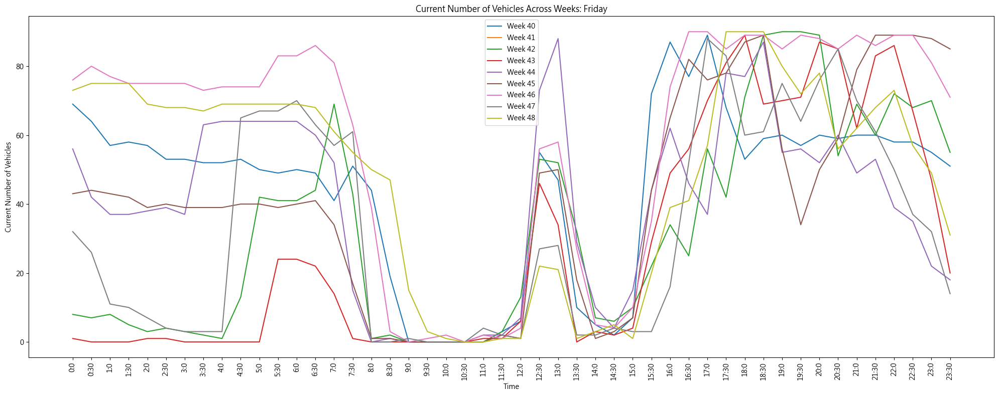

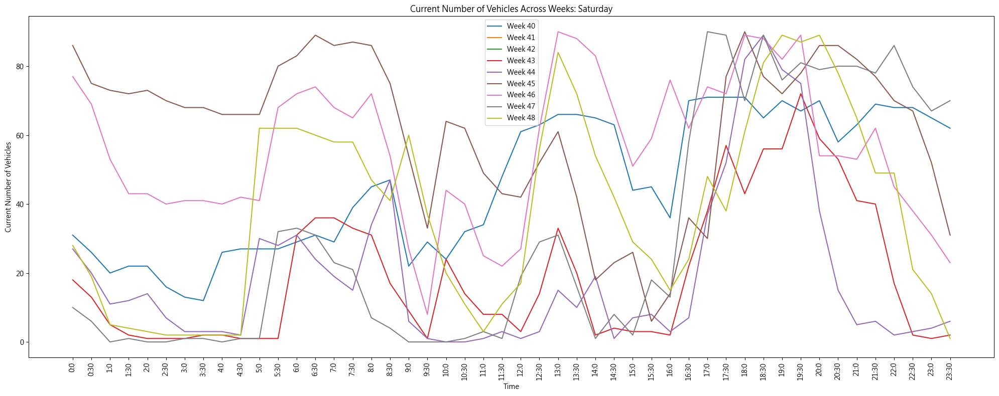

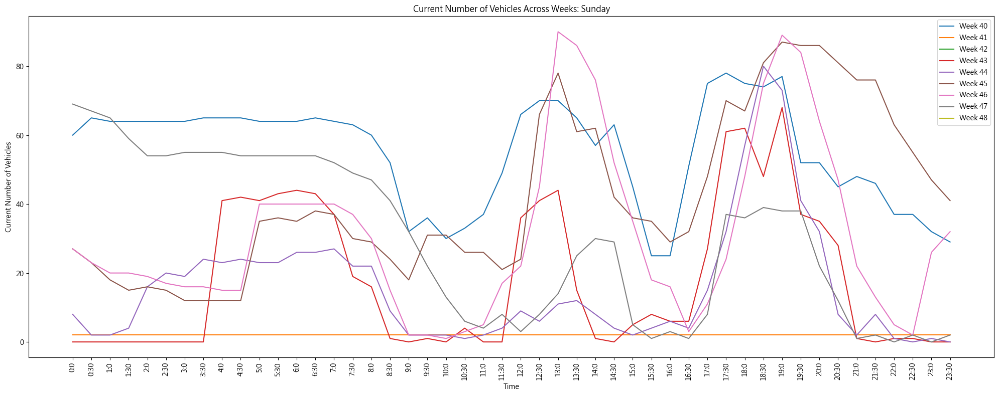

In [30]:
plot_weekly_vehicle_data_30min(picture_30_min, 'Monday', week_list)
plot_weekly_vehicle_data_30min(picture_30_min, 'Teusday', week_list)
plot_weekly_vehicle_data_30min(picture_30_min, 'Wednesday',week_list)
plot_weekly_vehicle_data_30min(picture_30_min, 'Thursday', week_list)
plot_weekly_vehicle_data_30min(picture_30_min, 'Friday', week_list)
plot_weekly_vehicle_data_30min(picture_30_min, 'Saturday', week_list)
plot_weekly_vehicle_data_30min(picture_30_min, 'Sunday', week_list)

### Section 3：Per hour

In [31]:
### 繪製特定星期的每週車輛數量變化。
def plot_weekly_vehicle_data_hour(df, weekday, weeks):
    filtered_data = df[df['第幾周'].isin(weeks)]
    filtered_data = filtered_data[filtered_data['星期'] == weekday]
    unique_hours = np.sort(filtered_data['hour'].unique())
    # 繪圖
    plt.figure(figsize=(12, 8))
    for week in weeks:
        weekly_data = filtered_data[filtered_data['第幾周'] == week]
        weekly_data = (weekly_data.groupby(['hour'])['目前車輛數量']
            .mean()
            .reset_index(name='目前數量加總')
            .sort_values(by=['hour'], ascending=True))
        plt.plot(weekly_data['hour'], weekly_data['目前數量加總'], label=f'Week {week}')

    plt.xlabel('Time')
    plt.ylabel('Current Number of Vehicles')
    plt.title(f'Current Number of Vehicles Across Weeks: {weekday}')
    plt.legend()
    plt.xticks(unique_hours, rotation=90)  # Set x-ticks here
    plt.tight_layout()
    plt.show()

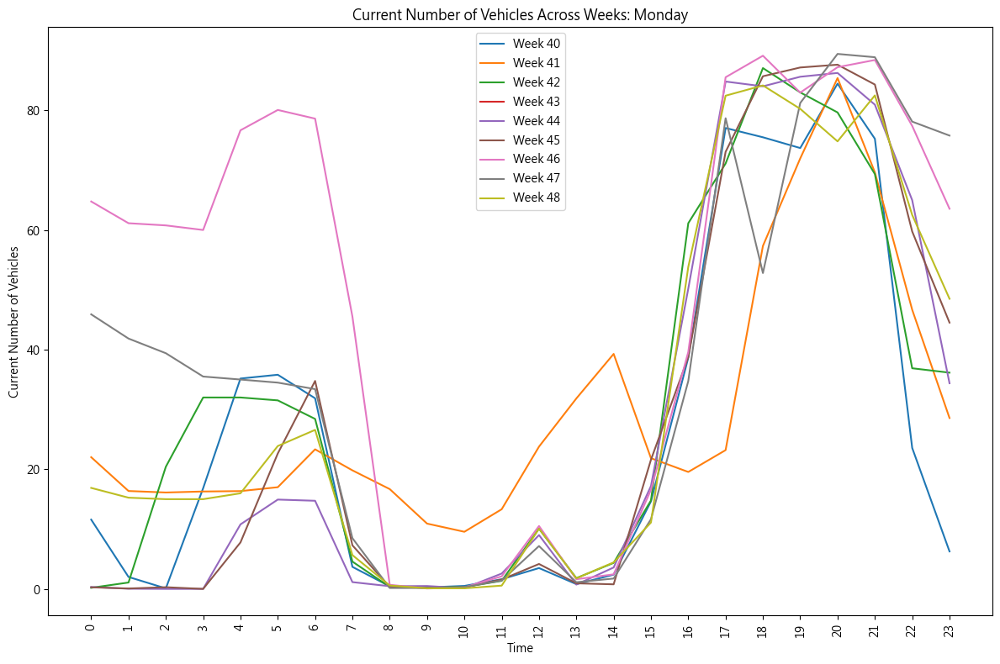

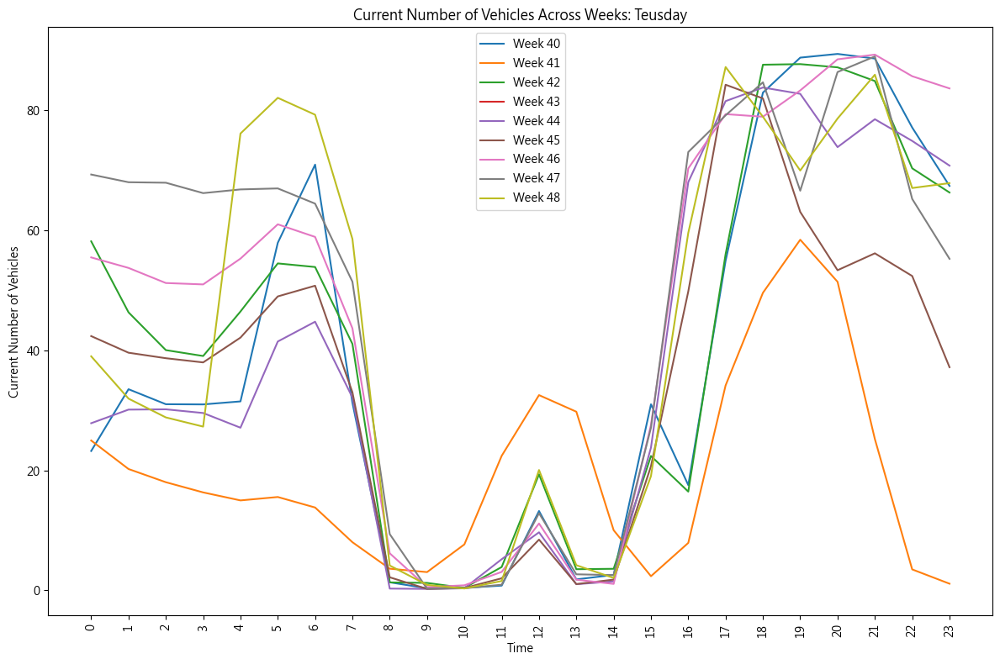

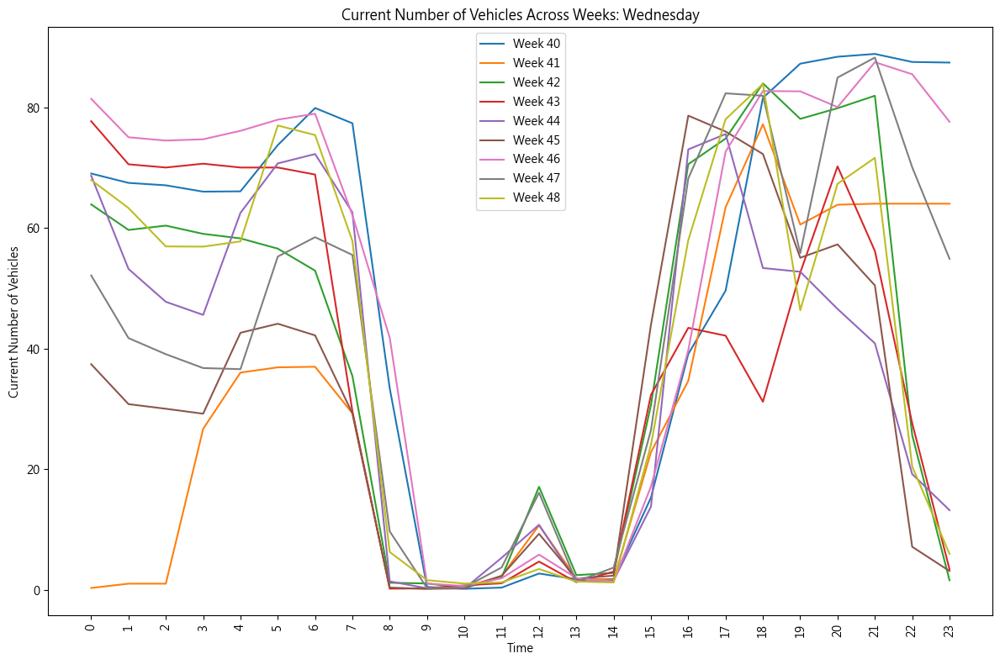

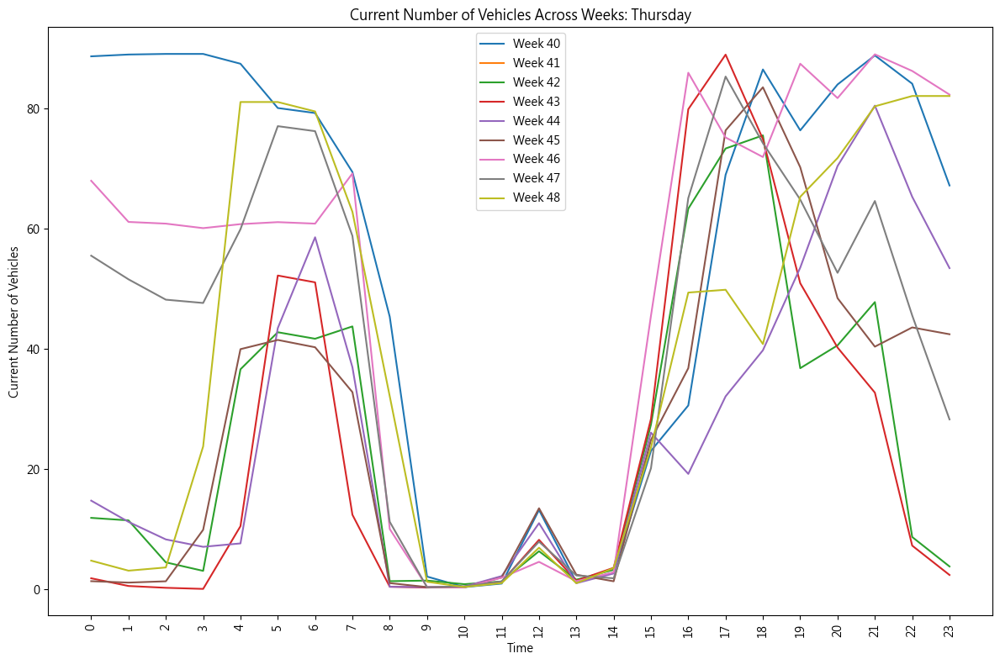

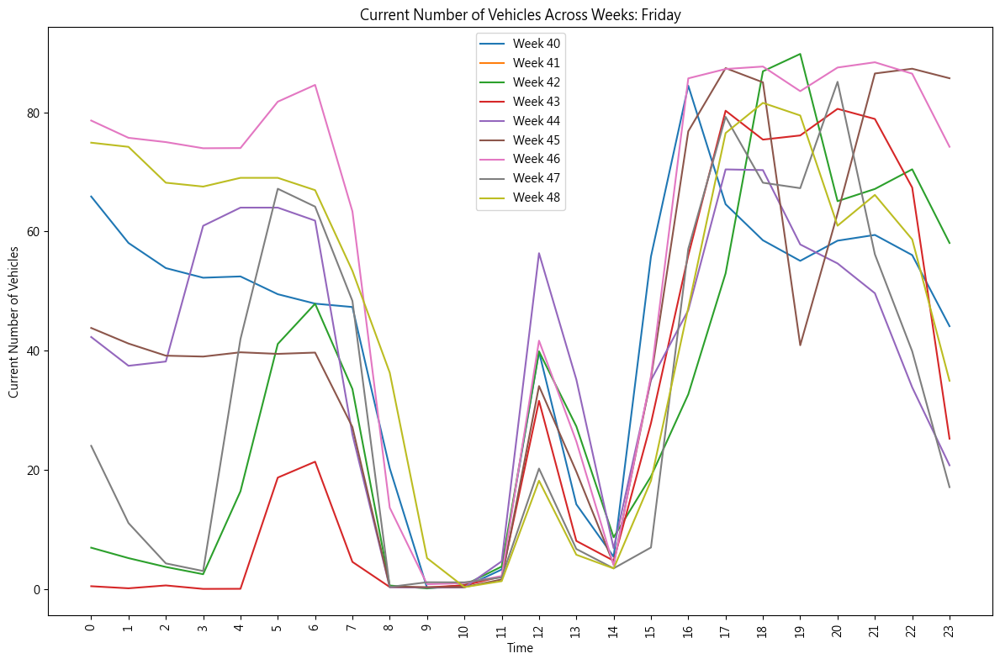

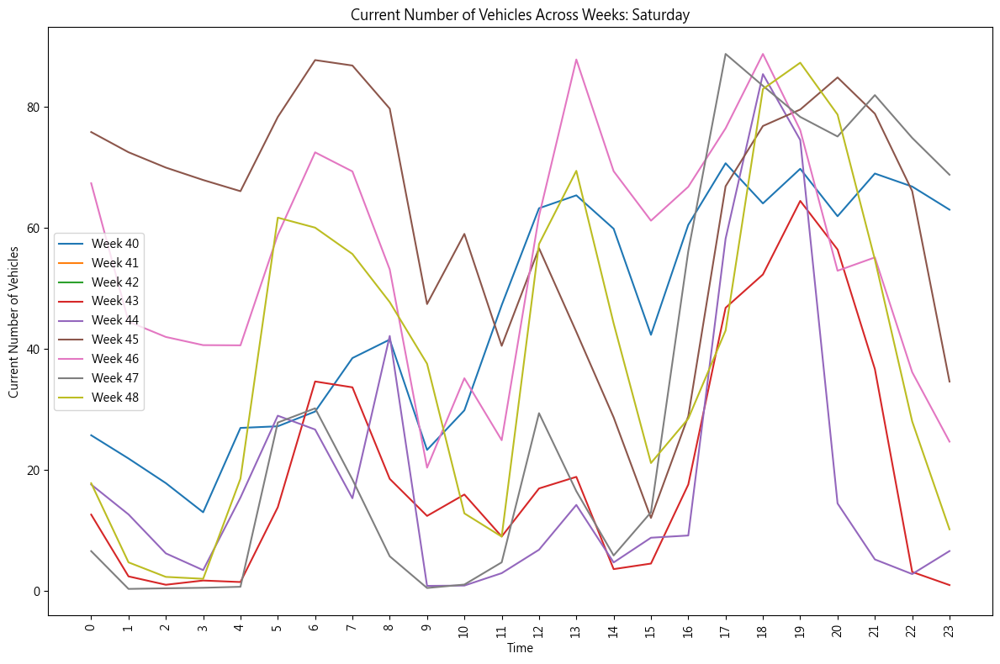

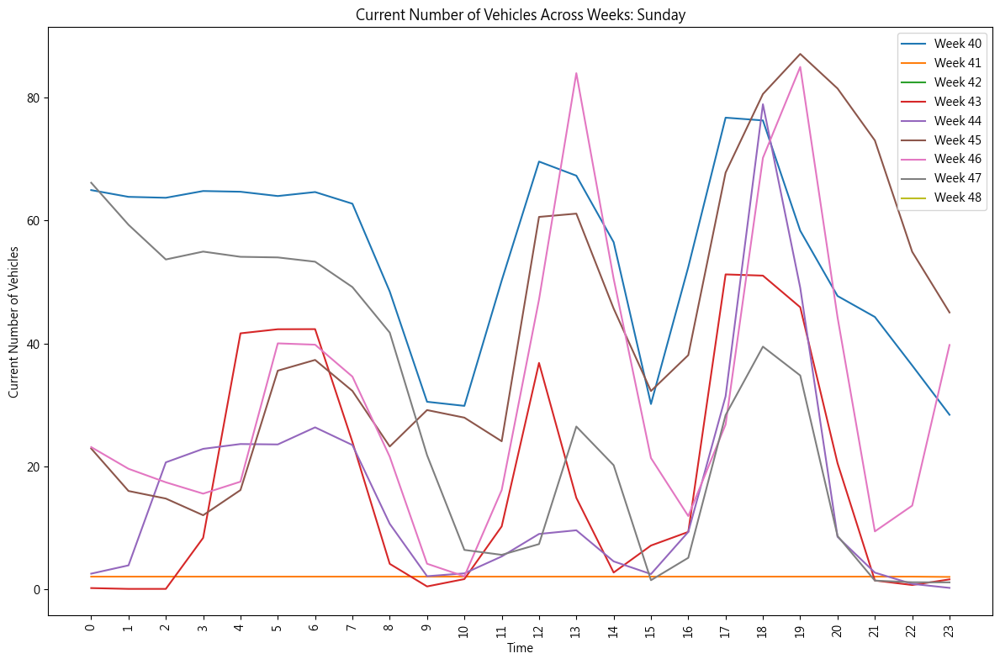

In [32]:
plot_weekly_vehicle_data_hour(picture, 'Monday', week_list)
plot_weekly_vehicle_data_hour(picture, 'Teusday', week_list)
plot_weekly_vehicle_data_hour(picture, 'Wednesday', week_list)
plot_weekly_vehicle_data_hour(picture, 'Thursday', week_list)
plot_weekly_vehicle_data_hour(picture, 'Friday', week_list)
plot_weekly_vehicle_data_hour(picture, 'Saturday',week_list)
plot_weekly_vehicle_data_hour(picture, 'Sunday', week_list)

In [33]:
### 繪製特定星期的每週【租借數量】變化。
def plot_weekly_vehicle_data_rent_diff_hour(df, weekday, weeks):
    filtered_data = df[df['第幾周'].isin(weeks)]
    filtered_data = filtered_data[filtered_data['星期'] == weekday]
    unique_hours = np.sort(filtered_data['hour'].unique())
    # 繪圖
    plt.figure(figsize=(12, 8))
    for week in weeks:
        weekly_data = filtered_data[filtered_data['第幾周'] == week]
        weekly_data = (weekly_data.groupby(['hour'])['租借數量']
            .sum()
            .reset_index(name='租借數量加總')
            .sort_values(by=['hour'], ascending=True))
        plt.plot(weekly_data['hour'], weekly_data['租借數量加總'], label=f'Week {week}')

    plt.xlabel('Time')
    plt.ylabel('租借數量 of Vehicles')
    plt.title(f'租借數量 of Vehicles Across Weeks: {weekday}')
    plt.legend()
    plt.xticks(unique_hours, rotation=90)
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

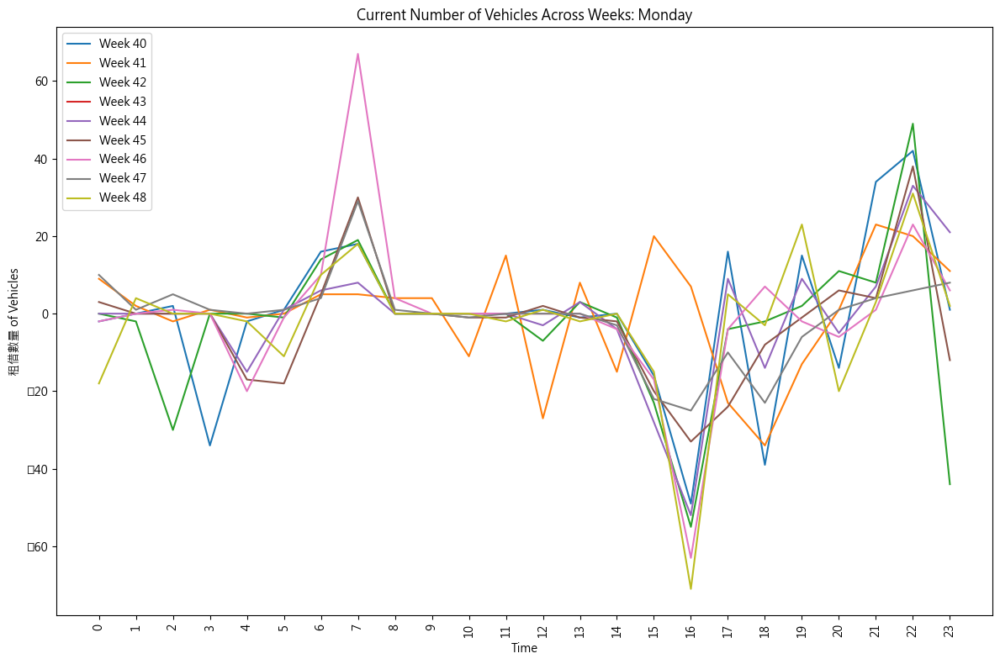

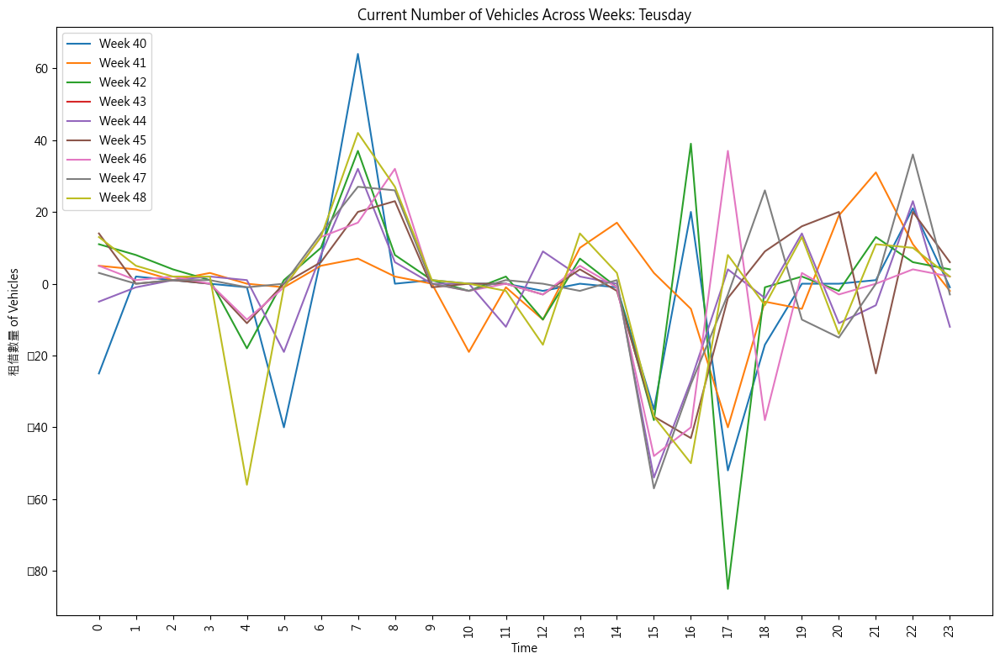

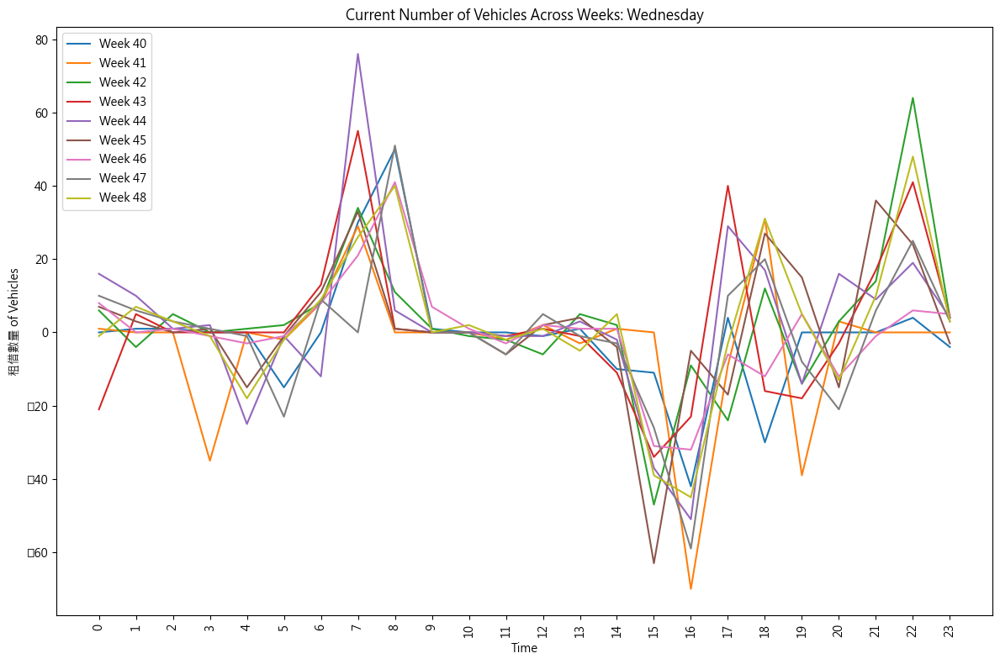

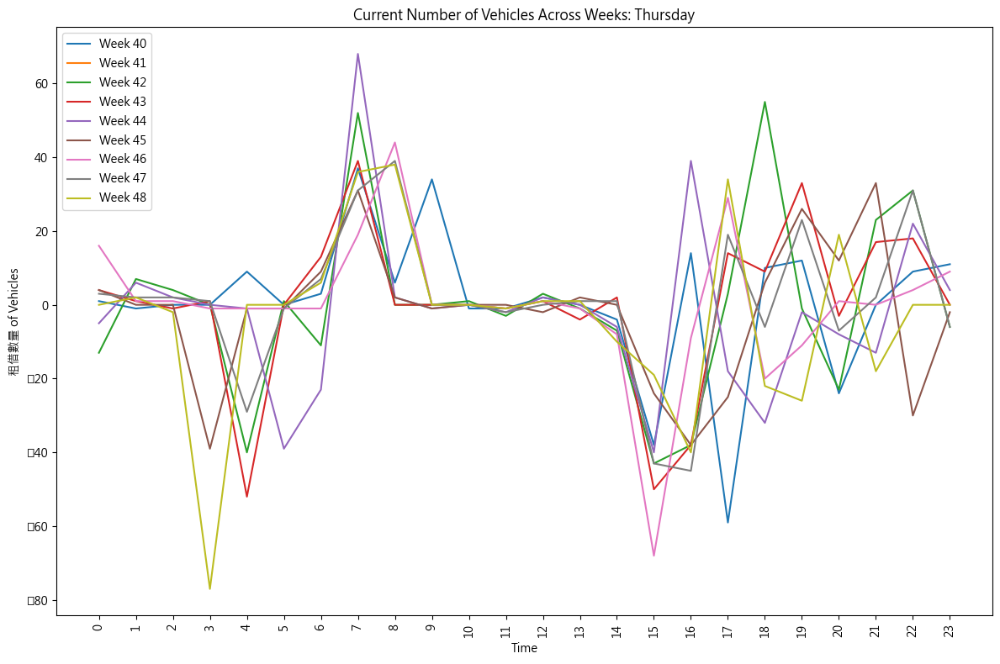

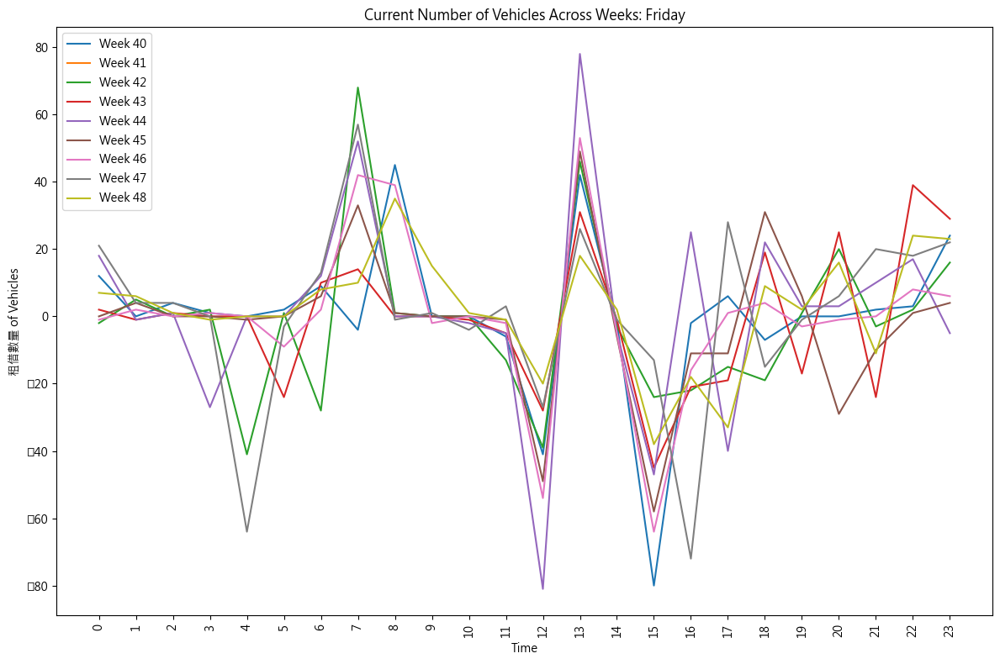

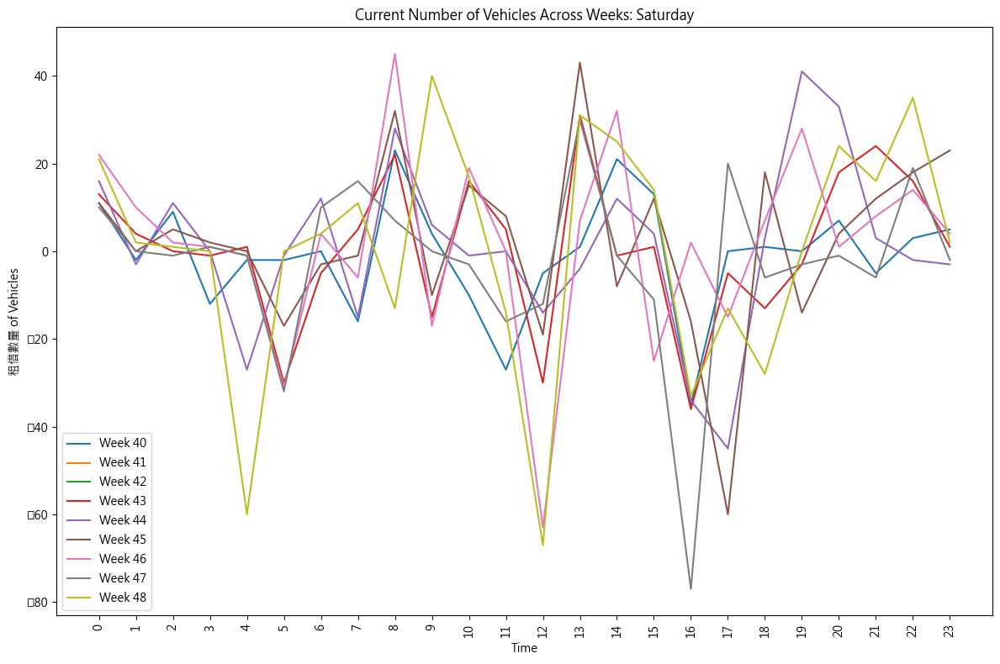

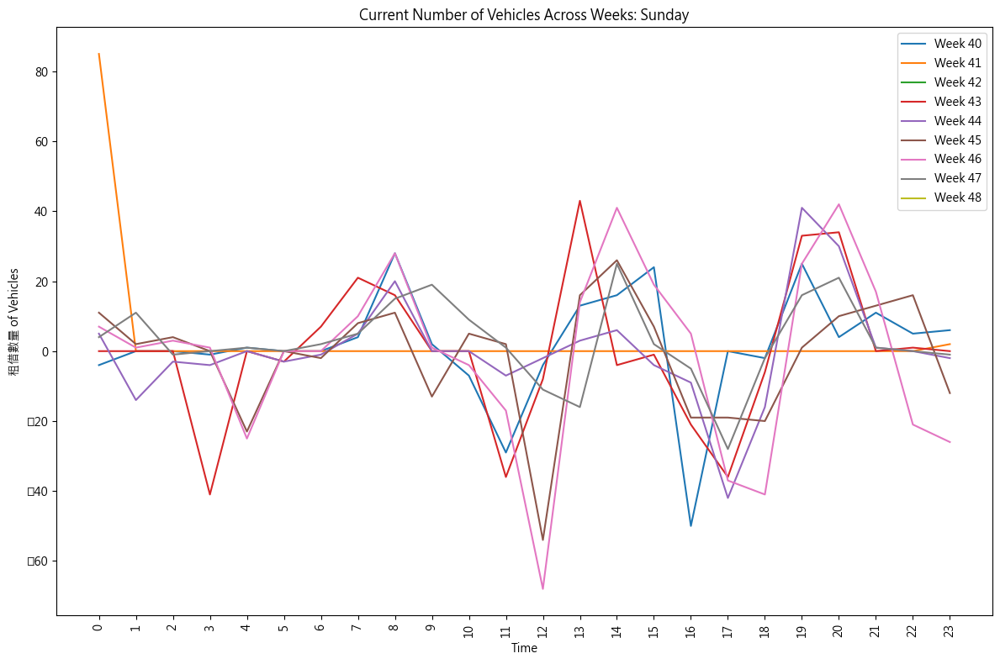

In [34]:
plot_weekly_vehicle_data_rent_diff_hour(picture, 'Monday', week_list)
plot_weekly_vehicle_data_rent_diff_hour(picture, 'Teusday', week_list)
plot_weekly_vehicle_data_rent_diff_hour(picture, 'Wednesday', week_list)
plot_weekly_vehicle_data_rent_diff_hour(picture, 'Thursday', week_list)
plot_weekly_vehicle_data_rent_diff_hour(picture, 'Friday', week_list)
plot_weekly_vehicle_data_rent_diff_hour(picture, 'Saturday',week_list)
plot_weekly_vehicle_data_rent_diff_hour(picture, 'Sunday', week_list)

### 平日 vs 假日 

In [35]:
picture.head()

,timestamp,總停車格,目前車輛數量,空位數量,month,day,weekday,hour,minute,第幾周,星期,workday,day_datetime,租借數量
0,2023-10-02 00:00:00,90,0,90,10,2,0,0,0,40,Monday,1,0:0,0
1,2023-10-02 00:01:00,90,0,90,10,2,0,0,1,40,Monday,1,0:1,0
2,2023-10-02 00:02:00,90,0,90,10,2,0,0,2,40,Monday,1,0:2,0
3,2023-10-02 00:03:00,90,0,90,10,2,0,0,3,40,Monday,1,0:3,0
4,2023-10-02 00:04:00,90,2,88,10,2,0,0,4,40,Monday,1,0:4,-2


In [36]:
picture_filter = picture[picture['總停車格']!=0]

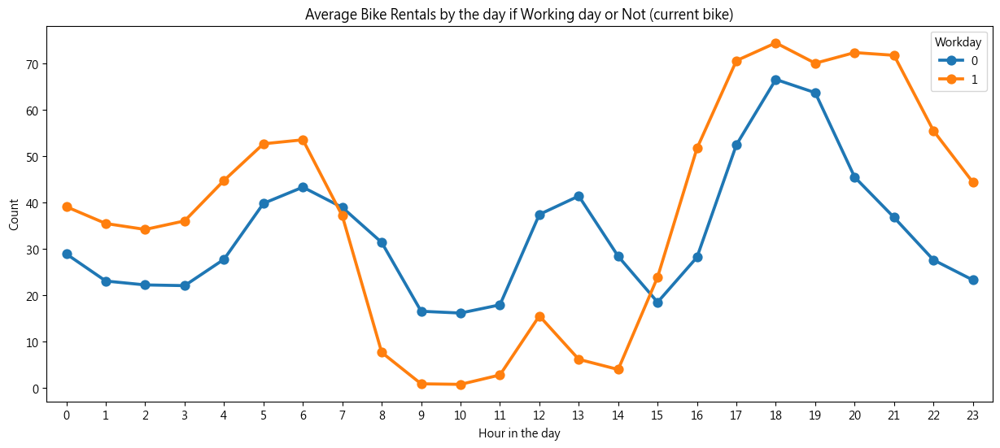

In [37]:
group_work_hour = pd.DataFrame(picture_filter.groupby(['workday', 'hour'])['目前車輛數量'].mean()).reset_index()

# 繪製點圖
plt.figure(figsize=(15, 6)) 
sns.pointplot(data=group_work_hour, x='hour', y='目前車輛數量', hue='workday')

plt.xlabel('Hour in the day')
plt.ylabel('Count')
plt.title('Average Bike Rentals by the day if Working day or Not (current bike)')
plt.legend(title='Workday')
plt.show()

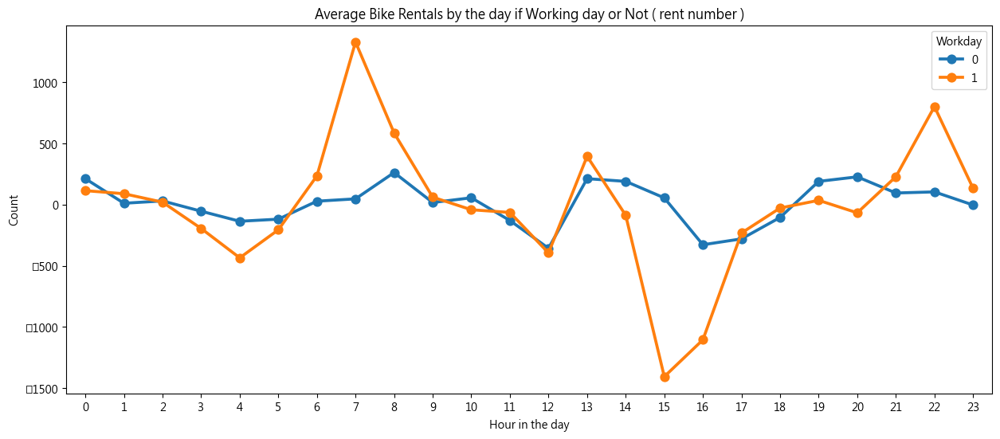

In [38]:
group_work_hour = pd.DataFrame(picture_filter.groupby(['workday', 'hour'])['租借數量'].sum()).reset_index()

# 繪製點圖
plt.figure(figsize=(15, 6)) 
sns.pointplot(data=group_work_hour, x='hour', y='租借數量', hue='workday')

plt.xlabel('Hour in the day')
plt.ylabel('Count')
plt.title('Average Bike Rentals by the day if Working day or Not ( rent number )')
plt.legend(title='Workday')
plt.show()

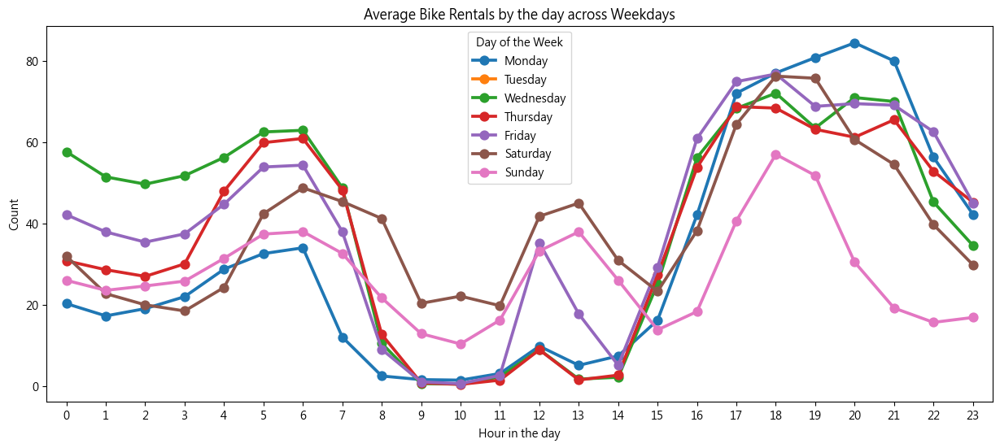

In [39]:
hue_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
group_day_hour = pd.DataFrame(picture_filter.groupby(['星期', 'hour'])['目前車輛數量'].mean()).reset_index()

plt.figure(figsize=(15, 6)) 
sns.pointplot(data=group_day_hour, x='hour', y='目前車輛數量', hue='星期', hue_order=hue_order)

plt.xlabel('Hour in the day')
plt.ylabel('Count')
plt.title('Average Bike Rentals by the day across Weekdays')
plt.legend(title='Day of the Week')
plt.show()



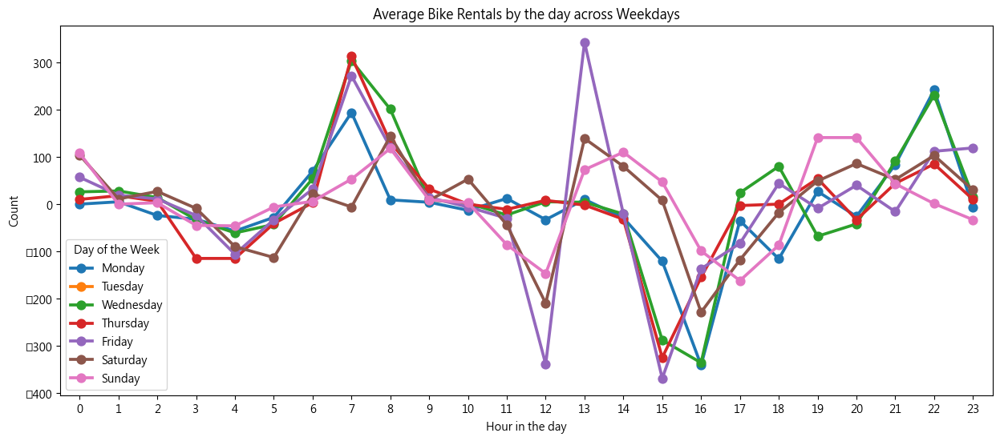

In [40]:
hue_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
group_day_hour = pd.DataFrame(picture_filter.groupby(['星期', 'hour'])['租借數量'].sum()).reset_index()


plt.figure(figsize=(15, 6))  
sns.pointplot(data=group_day_hour, x='hour', y='租借數量', hue='星期', hue_order=hue_order)

plt.xlabel('Hour in the day')
plt.ylabel('Count')
plt.title('Average Bike Rentals by the day across Weekdays')
plt.legend(title='Day of the Week')
plt.show()
